# [모듈 1.1] 고객 이탈 데이터 준비, XGBoost 훈련 및 평가

### [알림] <font coler="red"> conda_python3 커널 </font> 과 함께 사용해야 합니다.

* 이 노트북은 `0.1.Install_Package` 반드시 먼저 실행해야 합니다.

### 참고:
- 노트북에서 사용 중인 "고객 이탈 데이터 셋" 설명, 데이터 탐색, SageMaker XGBoost 의 훈련 및 배포는 아래 노트북에서 참조가 가능합니다. 자세한 데이터 셋의 설명은 생략 합니다.
- 이 노트북은 참조 노트북에서 다루지 않은 내용을 중심으로 합니다. 

* Customer churn prediction with SageMaker XGBoost
    * https://github.com/mullue/churn-pred-xgboost



# 0. 환경 셋업

In [1]:
import pandas as pd
pd.set_option("display.max_columns", 500)

import numpy as np
import matplotlib.pyplot as plt
import os
import time
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(style="whitegrid")


import sagemaker
from sagemaker import get_execution_role

sess = sagemaker.Session()
bucket = sess.default_bucket()
prefix = "ml_data_prep_workshop/xgboost-churn"
role = get_execution_role()

파이썬 라이브러리를 로딩시에 재로딩을 하는 코드 입니다.

In [2]:
%load_ext autoreload
%autoreload 2

# 1. 데이타 준비

고객 이탈 데이타를 아래 S3 에서 다운로드 합니다.

In [3]:
!aws s3 cp s3://sagemaker-sample-files/datasets/tabular/synthetic/churn.txt ./

download: s3://sagemaker-sample-files/datasets/tabular/synthetic/churn.txt to ./churn.txt


In [4]:
churn = pd.read_csv("./churn.txt")
churn

,State,Account Length,Area Code,Phone,Int'l Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,Intl Mins,Intl Calls,Intl Charge,CustServ Calls,Churn?
0,PA,163,806,403-2562,no,yes,300,8.162204,3,7.579174,3.933035,4,6.508639,4.065759,100,5.111624,4.928160,6,5.673203,3,True.
1,SC,15,836,158-8416,yes,no,0,10.018993,4,4.226289,2.325005,0,9.972592,7.141040,200,6.436188,3.221748,6,2.559749,8,False.
2,MO,131,777,896-6253,no,yes,300,4.708490,3,4.768160,4.537466,3,4.566715,5.363235,100,5.142451,7.139023,2,6.254157,4,False.
3,WY,75,878,817-5729,yes,yes,700,1.268734,3,2.567642,2.528748,5,2.333624,3.773586,450,3.814413,2.245779,6,1.080692,6,False.
4,WY,146,878,450-4942,yes,no,0,2.696177,3,5.908916,6.015337,3,3.670408,3.751673,250,2.796812,6.905545,4,7.134343,6,True.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,NH,4,787,151-3162,yes,yes,800,10.862632,5,7.250969,6.936164,1,8.026482,4.921314,350,6.748489,4.872570,8,2.122530,9,False.
4996,SD,140,836,351-5993,no,no,0,1.581127,8,3.758307,7.377591,7,1.328827,0.939932,300,4.522661,6.938571,2,4.600473,4,False.
4997,SC,32,836,370-3127,no,yes,700,0.163836,5,4.243980,5.841852,3,2.340554,0.939469,450,5.157898,4.388328,7,1.060340,6,False.
4998,MA,142,776,604-2108,yes,yes,600,2.034454,5,3.014859,4.140554,3,3.470372,6.076043,150,4.362780,7.173376,3,4.871900,7,True.


###  레이블 컬럼을 숫자형으로 변경 혹은 유지

레이블 컬럼이 숫자형으로 1, 0 이면 데이터 프레임의 가장 앞에 위치 시킴.
이유는 "상관 계수 분석시" 에 레이블 컬럼도 포함시기키 위함 입니다.

In [5]:
from src.tabular_utils import change_y

#    isChange 이면 레이블 컬럼을 데이터 프레임의 가장 맨 앞에 위치 함.
#    그렇지 않으면 'True.' --> 1 로 바꾸고, 아니면 0으로 합니다.
churn = change_y(churn, col='Churn?', isChange=True)
churn

,Churn?,State,Account Length,Area Code,Phone,Int'l Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,Intl Mins,Intl Calls,Intl Charge,CustServ Calls
0,1,PA,163,806,403-2562,no,yes,300,8.162204,3,7.579174,3.933035,4,6.508639,4.065759,100,5.111624,4.928160,6,5.673203,3
1,0,SC,15,836,158-8416,yes,no,0,10.018993,4,4.226289,2.325005,0,9.972592,7.141040,200,6.436188,3.221748,6,2.559749,8
2,0,MO,131,777,896-6253,no,yes,300,4.708490,3,4.768160,4.537466,3,4.566715,5.363235,100,5.142451,7.139023,2,6.254157,4
3,0,WY,75,878,817-5729,yes,yes,700,1.268734,3,2.567642,2.528748,5,2.333624,3.773586,450,3.814413,2.245779,6,1.080692,6
4,1,WY,146,878,450-4942,yes,no,0,2.696177,3,5.908916,6.015337,3,3.670408,3.751673,250,2.796812,6.905545,4,7.134343,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,0,NH,4,787,151-3162,yes,yes,800,10.862632,5,7.250969,6.936164,1,8.026482,4.921314,350,6.748489,4.872570,8,2.122530,9
4996,0,SD,140,836,351-5993,no,no,0,1.581127,8,3.758307,7.377591,7,1.328827,0.939932,300,4.522661,6.938571,2,4.600473,4
4997,0,SC,32,836,370-3127,no,yes,700,0.163836,5,4.243980,5.841852,3,2.340554,0.939469,450,5.157898,4.388328,7,1.060340,6
4998,1,MA,142,776,604-2108,yes,yes,600,2.034454,5,3.014859,4.140554,3,3.470372,6.076043,150,4.362780,7.173376,3,4.871900,7


# 2. 데이터 프로파일링

- pandas_profiling 패키지를 통해서 기본적인 데이터 탐색 및 권고 사항을 알려 줍니다.
- 약 2분 정도 소요 됩니다.

#### 참고
- 공식 페이지 --> [pandas_profiling](https://pandas-profiling.github.io/pandas-profiling/docs/master/rtd/)

In [6]:
%%time

import pandas_profiling as pp
pp.ProfileReport(churn)

CPU times: user 555 ms, sys: 64.1 ms, total: 619 ms
Wall time: 619 ms


Summarize dataset:   0%|          | 0/34 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 데이터 프로파일링 분석
- State, Phone 은 High Cardinality 로 피쳐 제외 권고
- Phone 제외시에 지역 코드인 Area Code 도 제외 필요.


![chun_profile_warning.png](img/chun_profile_warning.png)

## 상관 계수 분석
- 연관된 변수의 삭제를 위하여 상관 계수 분석 합니다.
- `threshold = 0.7` 기준하에 'Day Mins' 와 'Eve Charge' 가 하이라이트 됨.
    - 보통 0.9 이상이 되면 삭제를 하지만, 여기서는 예시로서 'Eve Charge' 를 삭제 하겠습니다.


In [7]:
#threshold = 0.9
threshold = 0.7


def highlight(value):
    if value > threshold:
        style = 'background-color: pink;color: black'        
    else:
        style = 'background-color: palegreen;color: black'        
    return style

dataset = 'churn_cl'
# Absolute value correlation matrix
corr_matrix = churn.corr().abs().round(2)
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
upper.style.format("{:.2f}").applymap(highlight)

,Churn?,Account Length,Area Code,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,Intl Mins,Intl Calls,Intl Charge,CustServ Calls
Churn?,nan,0.00,0.01,0.19,0.58,0.00,0.44,0.43,0.22,0.46,0.02,0.51,0.57,0.00,0.01,0.11,0.02
Account Length,nan,nan,0.04,0.01,0.02,0.01,0.01,0.00,0.03,0.01,0.02,0.00,0.03,0.02,0.00,0.03,0.04
Area Code,nan,nan,nan,0.02,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.00,0.00,0.02,0.01,0.01,0.01
VMail Message,nan,nan,nan,nan,0.14,0.00,0.18,0.10,0.10,0.03,0.06,0.14,0.16,0.02,0.13,0.01,0.07
Day Mins,nan,nan,nan,nan,nan,0.09,0.67,0.48,0.18,0.77,0.19,0.45,0.57,0.00,0.24,0.24,0.20
Day Calls,nan,nan,nan,nan,nan,nan,0.22,0.03,0.19,0.05,0.09,0.08,0.05,0.02,0.05,0.12,0.07
Day Charge,nan,nan,nan,nan,nan,nan,nan,0.57,0.24,0.37,0.15,0.13,0.37,0.01,0.12,0.25,0.26
Eve Mins,nan,nan,nan,nan,nan,nan,nan,nan,0.07,0.27,0.09,0.07,0.32,0.02,0.07,0.45,0.17
Eve Calls,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.47,0.22,0.22,0.32,0.00,0.11,0.02,0.43
Eve Charge,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.18,0.45,0.55,0.00,0.16,0.24,0.01


## 피쳐 제거
- "데이터 프로 파일링 분석" 과 "상관 계수 분석" 에 기반하여 아래 컬럼을 삭제 합니다.

In [8]:
drop_cols = ['State','Area Code','Phone','Eve Charge']
churn_cl = churn.drop(columns=drop_cols)
churn_cl

,Churn?,Account Length,Int'l Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Night Mins,Night Calls,Night Charge,Intl Mins,Intl Calls,Intl Charge,CustServ Calls
0,1,163,no,yes,300,8.162204,3,7.579174,3.933035,4,4.065759,100,5.111624,4.928160,6,5.673203,3
1,0,15,yes,no,0,10.018993,4,4.226289,2.325005,0,7.141040,200,6.436188,3.221748,6,2.559749,8
2,0,131,no,yes,300,4.708490,3,4.768160,4.537466,3,5.363235,100,5.142451,7.139023,2,6.254157,4
3,0,75,yes,yes,700,1.268734,3,2.567642,2.528748,5,3.773586,450,3.814413,2.245779,6,1.080692,6
4,1,146,yes,no,0,2.696177,3,5.908916,6.015337,3,3.751673,250,2.796812,6.905545,4,7.134343,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,0,4,yes,yes,800,10.862632,5,7.250969,6.936164,1,4.921314,350,6.748489,4.872570,8,2.122530,9
4996,0,140,no,no,0,1.581127,8,3.758307,7.377591,7,0.939932,300,4.522661,6.938571,2,4.600473,4
4997,0,32,no,yes,700,0.163836,5,4.243980,5.841852,3,0.939469,450,5.157898,4.388328,7,1.060340,6
4998,1,142,yes,yes,600,2.034454,5,3.014859,4.140554,3,6.076043,150,4.362780,7.173376,3,4.871900,7


## 카테고리 변수의 이진 변수 (One-Hot Encoding) 변환
- XGBoost 알고리즘은 카테고리 변수를 사용할 수 없어서, 이진 숫자형의 값으로 변환 합니다. (0 혹은 1)

In [9]:
def get_dummy_df(df, prefix, col):
    ldf = df.copy()
    one_hot = pd.get_dummies(ldf[col], prefix=prefix)
    ldf.drop(columns=col, inplace=True)
    ldf = pd.concat([ldf, one_hot], axis=1)
    
    
    return ldf

churn_cl = get_dummy_df(churn_cl, prefix='IntlPlan', col='Int\'l Plan')
churn_cl = get_dummy_df(churn_cl, prefix='VMailPlan', col='VMail Plan')
churn_cl



,Churn?,Account Length,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Night Mins,Night Calls,Night Charge,Intl Mins,Intl Calls,Intl Charge,CustServ Calls,IntlPlan_no,IntlPlan_yes,VMailPlan_no,VMailPlan_yes
0,1,163,300,8.162204,3,7.579174,3.933035,4,4.065759,100,5.111624,4.928160,6,5.673203,3,1,0,0,1
1,0,15,0,10.018993,4,4.226289,2.325005,0,7.141040,200,6.436188,3.221748,6,2.559749,8,0,1,1,0
2,0,131,300,4.708490,3,4.768160,4.537466,3,5.363235,100,5.142451,7.139023,2,6.254157,4,1,0,0,1
3,0,75,700,1.268734,3,2.567642,2.528748,5,3.773586,450,3.814413,2.245779,6,1.080692,6,0,1,0,1
4,1,146,0,2.696177,3,5.908916,6.015337,3,3.751673,250,2.796812,6.905545,4,7.134343,6,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,0,4,800,10.862632,5,7.250969,6.936164,1,4.921314,350,6.748489,4.872570,8,2.122530,9,0,1,0,1
4996,0,140,0,1.581127,8,3.758307,7.377591,7,0.939932,300,4.522661,6.938571,2,4.600473,4,1,0,1,0
4997,0,32,700,0.163836,5,4.243980,5.841852,3,0.939469,450,5.157898,4.388328,7,1.060340,6,1,0,0,1
4998,1,142,600,2.034454,5,3.014859,4.140554,3,6.076043,150,4.362780,7.173376,3,4.871900,7,0,1,0,1


# 3. 데이터 세트 분리
- 전체 데이타를 8:1:1 의 비율로 훈련, 검증, 테스트 데이터 셋으로 분리 합니다.
- 훈련과 검증 데이터는 CSV 데이터로 로컬에 저장 합니다.

In [10]:
train_data, validation_data, test_data = np.split(
    churn_cl.sample(frac=1, random_state=1024),
    [int(0.8 * len(churn_cl)), int(0.9 * len(churn_cl))],
)
train_data.to_csv("train.csv", header=True, index=False)
validation_data.to_csv("validation.csv", header=True, index=False)

## 로컬의 데이터를 S3에 업로딩

In [11]:
import sagemaker

sess = sagemaker.Session()
training = sess.upload_data(path="train.csv", key_prefix=prefix + "/training")
validation = sess.upload_data(path="validation.csv", key_prefix=prefix + "/validation")
print(training)
print(validation)  



s3://sagemaker-ap-northeast-2-057716757052/ml_data_prep_workshop/xgboost-churn/training/train.csv
s3://sagemaker-ap-northeast-2-057716757052/ml_data_prep_workshop/xgboost-churn/validation/validation.csv


# 4. SageMaker 모델  훈련

In [12]:
# train_instance_type = 'local'
train_instance_type = 'ml.m4.2xlarge'

from sagemaker.xgboost import XGBoost

xgb_estimator = XGBoost(entry_point='train_xgb.py', 
                        source_dir = 'src',
                        role=role,
                        train_instance_count=1, 
                        train_instance_type= train_instance_type,
                        framework_version='0.90-2',
                        py_version='py3',
                        hyperparameters={
                              'label_column' : 'Churn?',
                              'max-depth': 5,
                              'eval-metric': 'auc',
                          }
                       )  

train_instance_type has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.
train_instance_count has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.
train_instance_type has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


In [13]:
%%time
xgb_estimator.fit({'training':training, 'validation':validation},
                  wait=True,
                 )

2021-12-30 12:23:22 Starting - Starting the training job...
2021-12-30 12:23:46 Starting - Launching requested ML instancesProfilerReport-1640867002: InProgress
......
2021-12-30 12:24:46 Starting - Preparing the instances for training.........
2021-12-30 12:26:18 Downloading - Downloading input data
2021-12-30 12:26:18 Training - Downloading the training image...
2021-12-30 12:26:51 Uploading - Uploading generated training modelINFO:sagemaker-containers:Imported framework sagemaker_xgboost_container.training
INFO:sagemaker-containers:No GPUs detected (normal if no gpus installed)
INFO:sagemaker_xgboost_container.training:Invoking user training script.
INFO:sagemaker-containers:Module train_xgb does not provide a setup.py. 
Generating setup.py
INFO:sagemaker-containers:Generating setup.cfg
INFO:sagemaker-containers:Generating MANIFEST.in
INFO:sagemaker-containers:Installing module with the following command:
/miniconda3/bin/python3 -m pip install . 
Processing /opt/ml/code
  Created wh

# 5. 모델 다운로드 및 평가



## 모델 가중치 다운로드 및 압축 해제

In [14]:
import pickle
import tarfile
sagemaker.s3.S3Downloader().download(xgb_estimator.model_data, ".")

tfile = tarfile.open("model.tar.gz")
tfile.extractall(".")

## 모델 가중치 로딩
- S3로 부터 다운로드 받은 가중치를 XGBoost 모델로 로딩 합니다.

In [15]:
import os, argparse, pickle
import xgboost as xgb
import pandas as pd

print("XGBoost", xgb.__version__)


def model_fn(model_dir):
    model = xgb.Booster()
    model.load_model(os.path.join(model_dir, 'xgb.model'))
    return model

xgb_model = model_fn(model_dir=".")

XGBoost 1.3.3
[12:27:35] WARNING: ../src/learner.cc:790: Loading model from XGBoost < 1.0.0, consider saving it again for improved compatibility


## 훈련 및 테스트 데이터 준비
- 모델 검증을 위해서는 테스트 데이터만 평가하면 되나, 훈련 데이터와 상호 비교를 위해서 훈련 데이터도 준비 합니다.

In [16]:
train_data # , validation_data test_data
label_name = 'Churn?'

y_train = train_data[label_name]
X_train = train_data.drop(columns=[label_name])


y_test = test_data[label_name]
X_test = test_data.drop(columns=[label_name])

DMatrix 형태로 추론을 하기 위한 포맷으로 변경 합니다.

In [17]:
from src.tabular_utils import get_binary_prediction, plot_cm2

payload_train = xgb.DMatrix(X_train)
payload_test = xgb.DMatrix(X_test)


## 훈련 데이터와 테스트 데이터로 추론

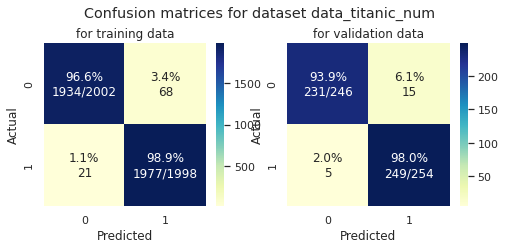

In [18]:
train_pred_prob = xgb_model.predict(payload_train)
train_pred = get_binary_prediction(train_pred_prob, threshold=0.5)

test_pred_prob = xgb_model.predict(payload_test)
test_pred = get_binary_prediction(test_pred_prob, threshold=0.5)

plot_cm2(y_train, train_pred, y_test, test_pred, "Confusion matrices for dataset data_titanic_num", figsize=(8,3))

## 분류 결과 리포트 및 ROC_AUC 커브 

Classification report for training data
               precision    recall  f1-score   support

           0       0.99      0.97      0.98      2002
           1       0.97      0.99      0.98      1998

    accuracy                           0.98      4000
   macro avg       0.98      0.98      0.98      4000
weighted avg       0.98      0.98      0.98      4000

Classification report for validation data
               precision    recall  f1-score   support

           0       0.98      0.94      0.96       246
           1       0.94      0.98      0.96       254

    accuracy                           0.96       500
   macro avg       0.96      0.96      0.96       500
weighted avg       0.96      0.96      0.96       500



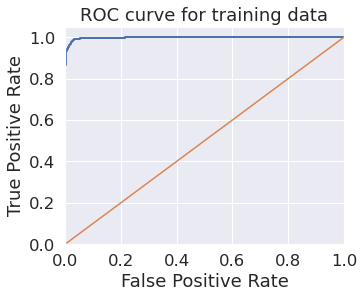

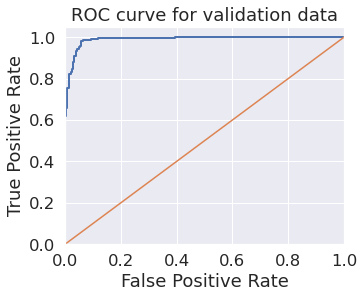

In [19]:
from src.tabular_utils import roc_auc_plot

roc_auc_plot(xgb_model, payload_train, y_train, payload_test, y_test)

# 5. 훈련 모델 분석 (SHAP)

## 훈련 데이터 셋 분석

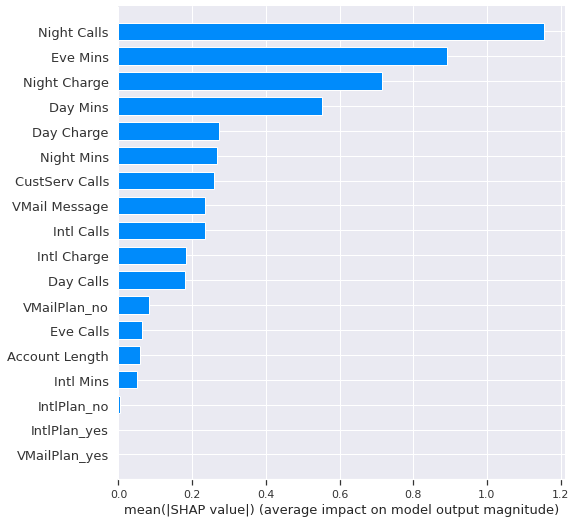

In [20]:
import shap

shap_values = shap.TreeExplainer(xgb_model).shap_values(X_train)
# shap_interaction_values = shap.TreeExplainer(xgb_model).shap_interaction_values(Xval)
shap.summary_plot(shap_values, X_train, plot_type="bar")

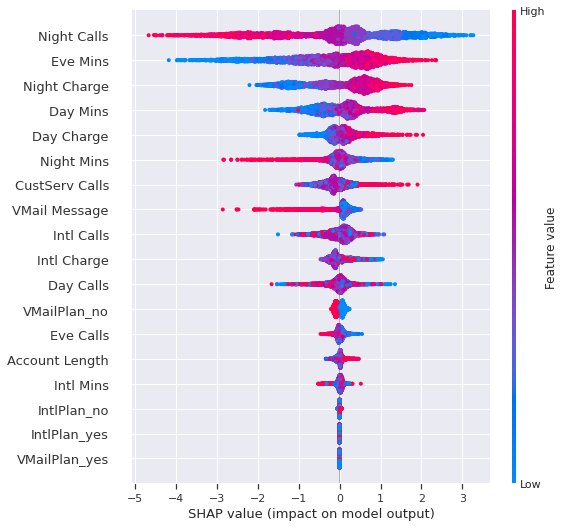

In [21]:
shap_values = shap.TreeExplainer(xgb_model).shap_values(X_train)
shap.summary_plot(shap_values, X_train)

In [22]:
from src.tabular_utils import data_force_plot_n

In [23]:
data_force_plot_n(xgb_model, X_train)

## 테스트 데이터 셋 분석

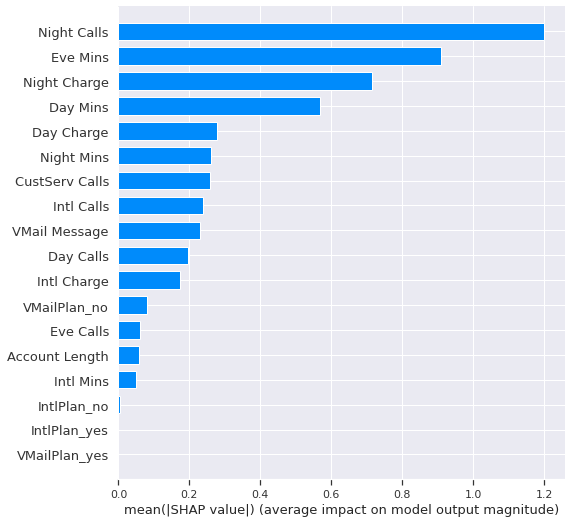

In [24]:
shap_values = shap.TreeExplainer(xgb_model).shap_values(X_test)
shap.summary_plot(shap_values, X_test, plot_type='bar')

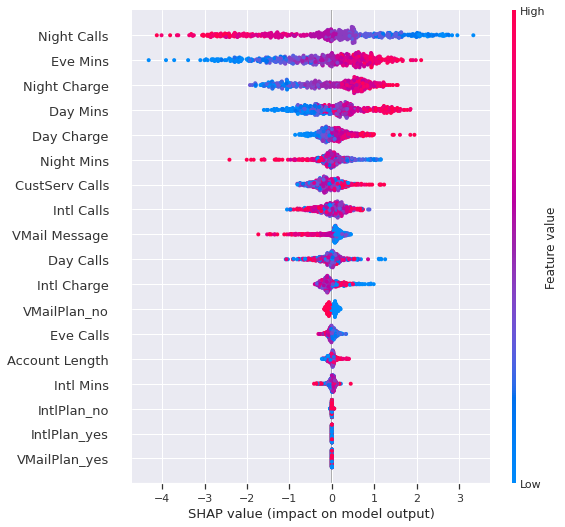

In [25]:
shap_values = shap.TreeExplainer(xgb_model).shap_values(X_test)
shap.summary_plot(shap_values, X_test)

In [26]:
data_force_plot_n(xgb_model, X_test)